# Image Registration

## Importing Libraries

In [14]:
import numpy as np
import cv2
import matplotlib.pyplot as plt
from google.colab.patches import cv2_imshow
import imutils

## Processing Input and Reference Images

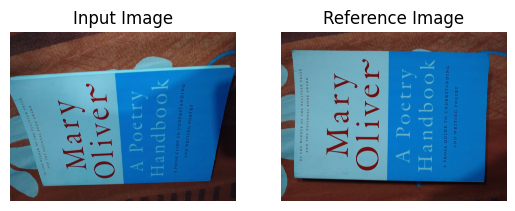

In [29]:
# loading the images
input_image = cv2.imread('input.jpeg')
reference_image = cv2.imread('reference.jpeg')

plt.subplot(1, 2, 1)
plt.axis('off')
plt.title('Input Image')
plt.imshow(input_image)

plt.subplot(1, 2, 2)
plt.axis('off')
plt.title('Reference Image')
plt.imshow(reference_image)

In [30]:
# converting the input and reference images to grayscale
input_imageGray = cv2.cvtColor(input_image, cv2.COLOR_BGR2GRAY)
reference_imageGray = cv2.cvtColor(reference_image, cv2.COLOR_BGR2GRAY)

## Feature Matching

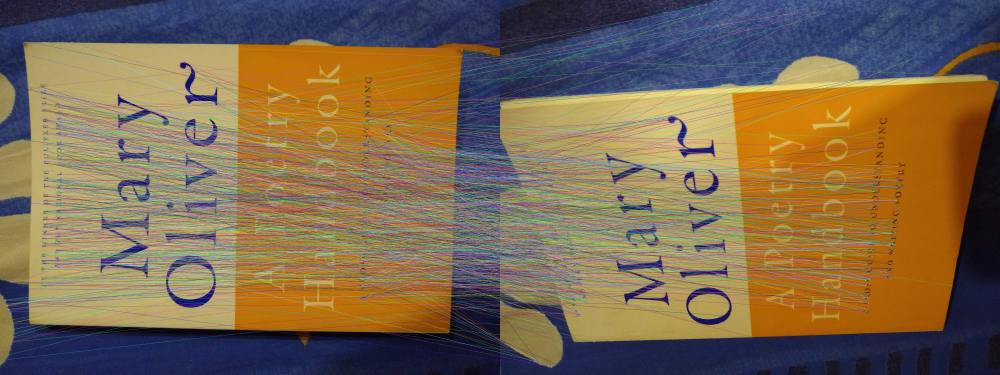

In [39]:
# use ORB to detect key features
orb = cv2.ORB_create(5000)
kpsR, descsR = orb.detectAndCompute(reference_imageGray, None)
kpsI, descsI = orb.detectAndCompute(input_imageGray, None)

# match the features
matcher = cv2.BFMatcher(cv2.NORM_HAMMING, crossCheck = True)
matches = matcher.match(descsI, descsR, None)

# sort the matched by distance
matches = sorted(matches, key=lambda x: x.distance)

# keep only the top matches
matches = matches[:int(len(matches)*0.9)]

# visualize the matches
matchedVis = cv2.drawMatches(reference_image, kpsR, input_image, kpsI, matches, None)
matchedVis = imutils.resize(matchedVis, width=1000)
cv2_imshow(matchedVis)

## Computing Homography Matrix

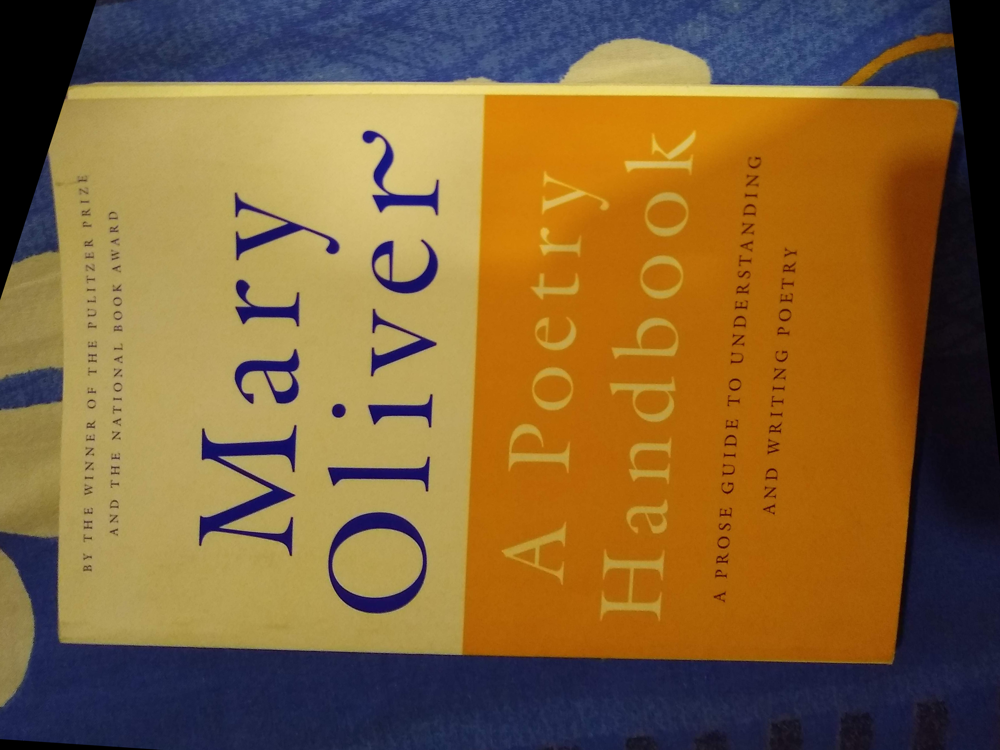

In [41]:
# allocate memory for the keypoints (x, y)-coordinates from the
# top matches -- we'll use these coordinates to compute our
# homography matrix
ptsR = np.zeros((len(matches), 2), dtype="float")
ptsI = np.zeros((len(matches), 2), dtype="float")

# loop over the top matches
for i in range(len(matches)):
  ptsI[i, :] = kpsI[matches[i].queryIdx].pt
  ptsR[i, :] = kpsR[matches[i].trainIdx].pt

# compute the homography matrix between the two sets of matched points
(H, mask) = cv2.findHomography(ptsI, ptsR, method=cv2.RANSAC)

# use the homography matrix to align the images
(h, w) = reference_image.shape[:2]
aligned = cv2.warpPerspective(input_image, H, (w, h))
cv2_imshow(aligned)